### this notebook is used for processing dopamine and serotonin imaging data
make sure you're using the pynapple environment

In [1]:
## import packages

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
from matplotlib.ticker import MaxNLocator
from matplotlib import gridspec
import seaborn as sns
import os
import glob
import datetime
import numpy as np
import pandas as pd
import math
from random import randrange
from random import randint
from tqdm import tqdm
import dabest
import sys
from BaselineRemoval import BaselineRemoval
import pynapple as nap
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
# %config InlineBackend.figure_format = 'retina'

import sys
sys.path.append('/Users/hunglo/Documents/python_codes/')
import binge

In [2]:
## plotting settings

## create color map
my_color_map = ['#56b4e9',
                '#e69f00',
                '#009e73',
                '#f0e442',
                '#0072b2',
                '#d55e00',
                '#cc79a7']
# convert to sns plotting rgb
my_color_map = sns.color_palette(my_color_map)

# 20% lighter 
my_color_map_grey_light = ['#B3B3B3',
                      '#89E7FF',
                      '#FFB91A',
                      '#33D1A6',
                      '#FFFF75',
                      '#33A5E5',
                      '#FF9133',
                      '#FFACDA']
my_color_map_grey_light = sns.color_palette(my_color_map_grey_light)

my_color_map_grey = ['#808080',
                      '#56b4e9',
                      '#e69f00',
                      '#009e73',
                      '#f0e442',
                      '#0072b2',
                      '#d55e00',
                      '#cc79a7']
# convert to sns plotting rgb
my_color_map_grey = sns.color_palette(my_color_map_grey)

color_map_black_grey = ['#000000','#808080']
color_map_black_grey = sns.color_palette(color_map_black_grey)

## font setting
plt.rcParams["font.family"] = 'Arial'
plt.rcParams.update({'font.size': 8})

# plt.rcParams["font.family"] = 'Helvetica Neue'

# ## set all figure background to white
# plt.rcParams['axes.facecolor']='white'
# plt.rcParams['savefig.facecolor']='white'

def save_plot_pdf(plot_name):
    fig_output_folder = '/Users/hunglo/Documents/inscopix_csv/fig_output/'
    kwargs = {"facecolor":"white","dpi":300,"bbox_inches":"tight"}
    # kwargs = {"facecolor":"white","dpi":300} # no tight arg here, to prevent fontsize changes
    plt.savefig(f'{fig_output_folder}{plot_name}.pdf',**kwargs)

def get_auto_colors(n_colors):
    auto_color_map_cat = sns.color_palette("husl", n_colors)
    return auto_color_map_cat

def correct_baseline_modploy(df_accepted):
    input_array = df_accepted.values
    polynomial_degree=2 #only needed for Modpoly and IModPoly algorithm
    baseObj=BaselineRemoval(input_array)
    Modpoly_output=baseObj.ModPoly(polynomial_degree)
    df_corrected = pd.DataFrame(data=Modpoly_output,index=df_accepted.index,columns=[' C1'])
    return df_corrected

def load_mouse_info_from_meta_data():
  import pandas as pd
  # import chardet
  filename = '/Users/hunglo/Documents/inscopix_csv/Recordings_overview_updated.csv'
  # url = "https://docs.google.com/spreadsheets/d/e/2PACX-1vTPyLFWYecnKapIC0TWEH5w_VZVyJYsDVCt0rfG73266Dm4XWtf7IwuIBbTV3TcYVABa8UEkcCMqDza/pub?gid=143829771&single=true&output=csv"
  # with open(filename, 'rb') as f:
  #     result = chardet.detect(f.read())  # or readline if the file is large

  # # print(result)
  # df_overview = pd.read_csv(filename, encoding=result['encoding'],on_bad_lines='skip',sep=';',skiprows=2)


  df_overview = pd.read_csv(filename,skiprows=2)
  df_overview = df_overview[df_overview['Imaging?']==True] ## Only load those sessions with recordings.
  mouse_id_list = df_overview['Mouse ID'].unique()
  mouse_id_list = mouse_id_list[~pd.isnull(mouse_id_list)]
  mouse_id_list = sorted(mouse_id_list)
  return df_overview, mouse_id_list

def get_metadata(mouse_id, date):
    df_overview, _ = load_mouse_info_from_meta_data()
    select_overview = df_overview[df_overview['Mouse ID'] == mouse_id].copy()
    select_overview = select_overview[select_overview['Recording date']=='20'+date]

    Pump1_solution = select_overview['Flavor 1'].to_numpy()[0].lower()
    Pump2_solution = select_overview['Flavor 2'].to_numpy()[0].lower()
    Food_deprivation = select_overview['Food_deprived'].to_numpy()[0].lower()
    if 'CaMK2a' in select_overview['Genotype'].to_numpy()[0]:
        Genotype = 'CaMK2'
    elif 'iSeroSnFR' in select_overview['Genotype'].to_numpy()[0]:
        Genotype = 'iSeroSnFR'
    elif 'dLight' in select_overview['Genotype'].to_numpy()[0]:
        Genotype = 'dLight'
    elif 'S2GC' in select_overview['Genotype'].to_numpy()[0]:
        Genotype = 'S2GC'
    elif 'S2' in select_overview['Genotype'].to_numpy()[0]:
        Genotype = 'S2'
    elif 'GC' in select_overview['Genotype'].to_numpy()[0]:
        Genotype = 'GC'
    else:
        Genotype = select_overview['Genotype'].to_numpy()[0]
    mouse_name = select_overview['Mouse Name'].to_numpy()[0]
    
    return Pump1_solution, Pump2_solution, Food_deprivation, Genotype, mouse_name

df_overview, mouse_id_list = load_mouse_info_from_meta_data()
df_overview.head()
# df_overview['Mouse ID'].unique()


,Mouse Name,Mouse ID,Genotype,Tg/viral,Session,Recording date,Body_weight,Food_intake_before,Food_intake_after,Food_deprived,...,Imaging?,Flavor 1,Flavor 2,Total_deliveries,Comment,CNMFe processed,Data curation,auROC quality,Used for presentation,Used for publication
1,Karl-Heinz Leopold,BES0224,CaMK2a-cre; Ai93D,Tg,2,2020.08.07,36.00,4.00,NaN,Mild,...,True,Strawberry,Water,0.0,NaN,done,NaN,Empty,NaN,NaN
2,Karl-Heinz Leopold,BES0224,CaMK2a-cre; Ai93D,Tg,3,2020.08.11,34.13,NaN,4.27,Mild,...,True,Strawberry,Water,5.0,NaN,done,NaN,NaN,NaN,NaN
3,Karl-Heinz Leopold,BES0224,CaMK2a-cre; Ai93D,Tg,4,2020.08.12,33.69,4.27,4.06,Mild,...,True,Strawberry,Water,0.0,NaN,done,NaN,Empty,NaN,NaN
4,Karl-Heinz Leopold,BES0224,CaMK2a-cre; Ai93D,Tg,5,2020.08.13,33.47,4.06,3.86,Mild,...,True,Strawberry,Water,0.0,NaN,done,NaN,NaN,NaN,NaN
5,Karl-Heinz Leopold,BES0224,CaMK2a-cre; Ai93D,Tg,6,2020.08.14,33.24,3.86,4.73,Mild,...,True,Strawberry,Water,0.0,NaN,done,NaN,Empty,NaN,NaN


In [3]:
### function block, need to move to "binge.py" later, but will keep them here

def norm_ca(df):
    df_norm = pd.DataFrame([])
    for idx,cell in enumerate(df.columns):
        ## normalize to 0-1
        df_max=np.max(df[cell])
        df_min=np.min(df[cell])
        df_norm[cell] = (df[cell]-df_min)/(df_max-df_min)
    return df_norm

def ca2_plot(df,scale=5,cell_idx=None,**kwargs):
    ## scale here is just to help viz
    if cell_idx == None:
        for idx,cell in enumerate(df.columns):
            plt.plot(df[cell]*scale+idx,lw=1,**kwargs)
    else:
        for idx,cell_ in enumerate(list(cell_idx)):
            ## normalize to 0-1
            cell = df.columns[idx]
            plt.plot(df[cell]*scale+idx,lw=1,**kwargs)

 
def detect_binge_bout(Pump1,interval=3):
    # if pump interval is less than 2 seconds?
    Pump1 = np.pad(Pump1, (2, 2), 'constant', constant_values=(0,0))
    diff = Pump1[1:]-Pump1[:-1]
    gap = diff>interval # binary data
    idx = np.where(gap == 1) # idx == 1
    start_concat, end_concat = [],[]
    for idx_ in idx:
        start_concat.append(Pump1[idx_+1])
        end_concat.append(Pump1[idx_])
    start_concat = start_concat[0][:-1] # remove empty starting
    end_concat = end_concat[0][1:] # remove empty ending

    binge_epoch = nap.IntervalSet(start_concat,end_concat)

    ## run through the rows to make sure there isn't no duration epochs
    ## note this should be taken care of from the pynapple package but somehow it isn't working properly 
    binge_epoch_clean = pd.DataFrame(data=[], columns=['start','end'])
    for n in range(binge_epoch.shape[0]):
        for x,y in binge_epoch[n:n+1].values:
            # print(x,y)
            if x!= y:
                binge_epoch_clean = pd.concat([binge_epoch_clean,binge_epoch[n:n+1]])
    binge_epoch_clean = nap.IntervalSet(binge_epoch_clean['start'],binge_epoch_clean['end'], time_units='s')
    return binge_epoch_clean


## downsample Ca2+ data to 10 Hz all together for easier processing afterward?
def downsample(df_accepted):
    ## add a condition here to check if it's already 10 hz
    from math import isclose
    a = df_accepted.index[1]-df_accepted.index[0] # get diff
    b = 0.05
    print(f'frame diff: {round(a,5)}')
    if isclose(a, b, abs_tol=1e-3):
        print('20 Hz -> 10 Hz')
        # if df_accepted.index[1]-df_accepted.index[0]
        from scipy import signal
        sample_num = int(df_accepted.shape[0]/2)
        df_downsampled =  pd.DataFrame(signal.resample(df_accepted, sample_num),index=df_accepted.index[::2][0:sample_num],columns=df_accepted.columns)
        return df_downsampled
    else:
        print('already 10 Hz')
        return df_accepted


def get_PETH_dict(df_accepted,slow_milk_ts_clean):
    ## now generate PSTH for each cell
    windowsize = 10 # sec, before + after
    half_window = int(windowsize/2)
    num_bins = windowsize * 10 # based on 10 Hz
    # t_scale = np.linspace(-5,5,num_bins)
    PETH_trace_milk = {} 

    cellset = df_accepted.columns
    for cell in cellset:
        PETH_trace = np.zeros([len(slow_milk_ts_clean),num_bins])
        for trial, time in enumerate(slow_milk_ts_clean):
            value = df_accepted[cell][time-half_window:time+half_window].values

            while len(value)<100:
                print(trial,time)
                print('add nan to last part')
                value = np.pad(value, (0, 1), 'constant', constant_values=(np.nan,np.nan))
            else:
                PETH_trace[trial,:] = value[0:num_bins] # keep the slicer here so in case we got one more value here
        PETH_trace_milk[cell] = PETH_trace
    return PETH_trace_milk


def get_PETH_binge(df_accepted,binge_epoch):
    ## now generate PSTH for each cell
    windowsize = 10 # sec, before + after
    half_window = int(windowsize/2)
    num_bins = windowsize * 10 # based on 10 Hz
    # t_scale = np.linspace(-5,5,num_bins)
    PETH_trace_binge_on = {} 
    PETH_trace_binge_off = {}

    cellset = df_accepted.columns

    for cell in cellset:
        PETH_trace = np.zeros([binge_epoch.shape[0],num_bins])
        for trial, time in enumerate(binge_epoch['start']):
            value = df_accepted[cell][time-half_window:time+half_window].values
            while len(value)<100:
                print(trial,time)
                print('add nan to last part')
                value = np.pad(value, (0, 1), 'constant', constant_values=(np.nan,np.nan))
            else:
                PETH_trace[trial,:] = value[0:num_bins] # keep the slicer here so in case we got one more value here
        PETH_trace_binge_on[cell] = PETH_trace

        PETH_trace = np.zeros([binge_epoch.shape[0],num_bins])
        for trial, time in enumerate(binge_epoch['end']):
            value = df_accepted[cell][time-half_window:time+half_window].values
            while len(value)<100:
                print(trial,time)
                print('add nan to last part')
                value = np.pad(value, (0, 1), 'constant', constant_values=(np.nan,np.nan))
            else:
                PETH_trace[trial,:] = value[0:num_bins] # keep the slicer here so in case we got one more value here
        PETH_trace_binge_off[cell] = PETH_trace
    return PETH_trace_binge_on,PETH_trace_binge_off

## align baseline to 0
def baseline_correct(PETH, window=1):
    for key in PETH.keys():
        matrix = PETH.get(key)
        for trial in range(matrix.shape[0]):
            matrix[trial,:] -= np.mean(matrix[trial,50-int(window*10):50]) # baseline mean centered (1 sec before event time)
        PETH[key] = matrix
    return PETH

  0%|          | 0/20 [00:00<?, ?it/s]

SNA089408 21.10.01


time difference: -10.567000000000007
num of neurons: 1


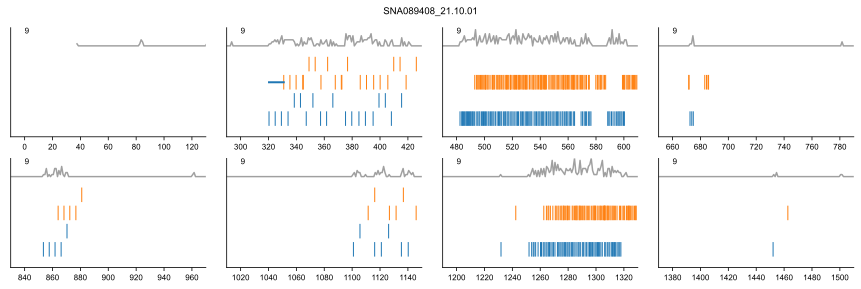

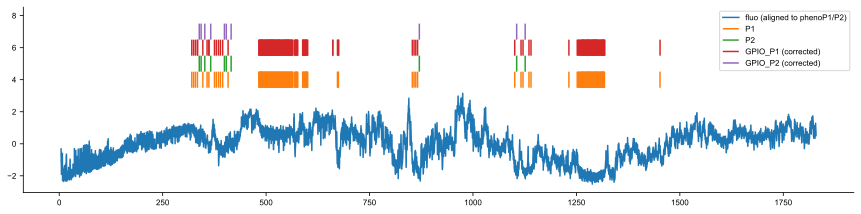

  5%|▌         | 1/20 [00:08<02:50,  8.96s/it]

frame diff: 0.04996
20 Hz -> 10 Hz
saved: SNA089408 21.10.01
SNA091599 21.10.11
time difference: -10.110000000000014
num of neurons: 1


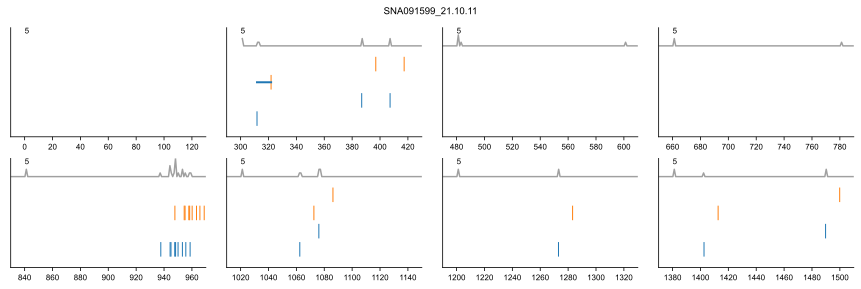

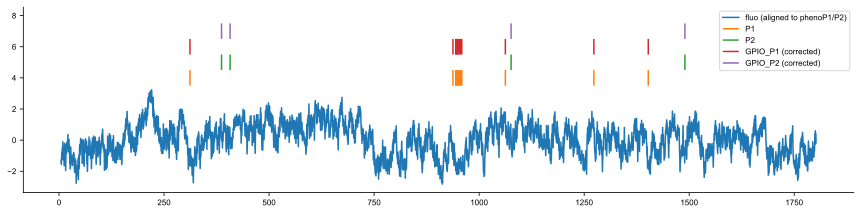

 10%|█         | 2/20 [00:14<02:03,  6.86s/it]

frame diff: 0.04996
20 Hz -> 10 Hz
saved: SNA091599 21.10.11
SNA091599 21.10.12
time difference: -8.237000000000009
num of neurons: 1


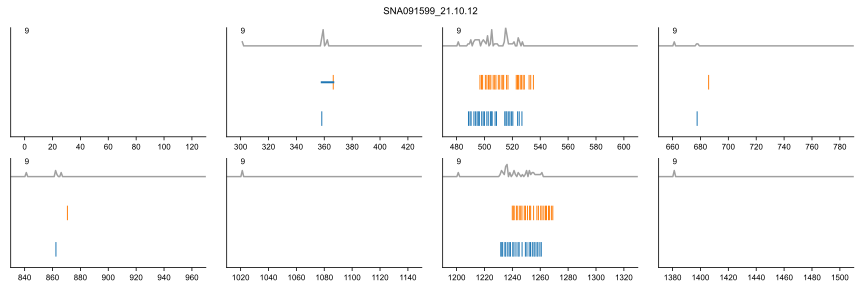

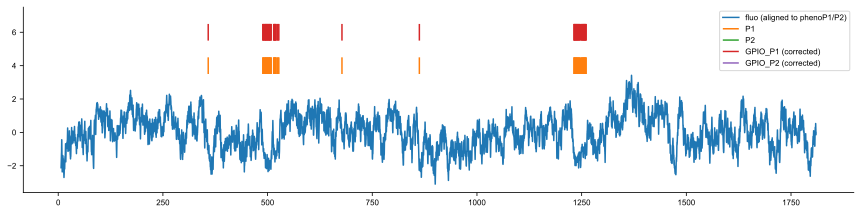

 15%|█▌        | 3/20 [00:19<01:43,  6.09s/it]

frame diff: 0.04996
20 Hz -> 10 Hz
saved: SNA091599 21.10.12
SNA091599 21.10.13
time difference: -10.480000000000004
num of neurons: 1


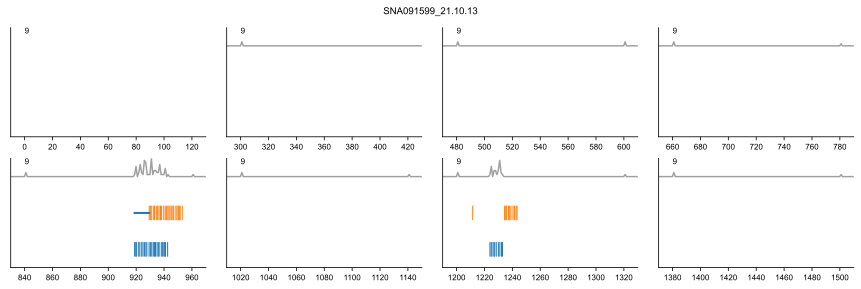

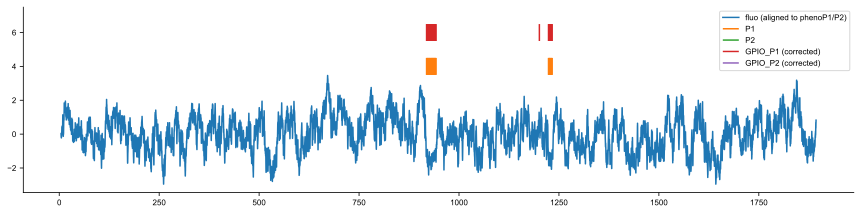

 20%|██        | 4/20 [00:25<01:34,  5.91s/it]

frame diff: 0.04996
20 Hz -> 10 Hz
saved: SNA091599 21.10.13
SNA091599 21.10.14
time difference: -6.8030000000000115
num of neurons: 1


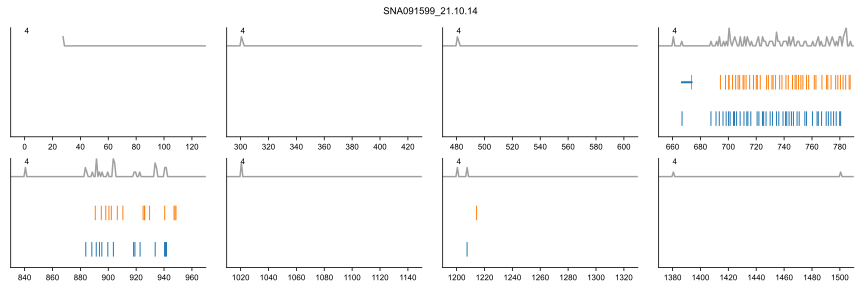

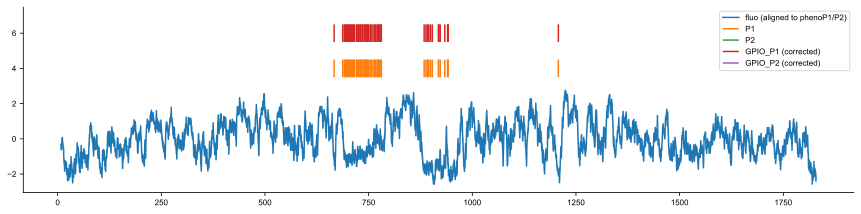

 25%|██▌       | 5/20 [00:30<01:25,  5.73s/it]

frame diff: 0.04996
20 Hz -> 10 Hz
saved: SNA091599 21.10.14
SNA091599 21.10.15
time difference: -5.885000000000005
num of neurons: 1


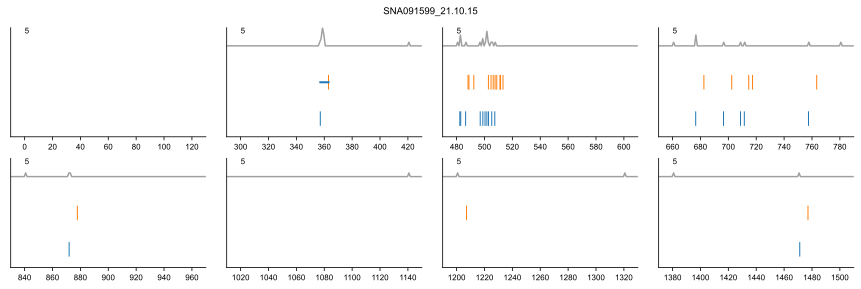

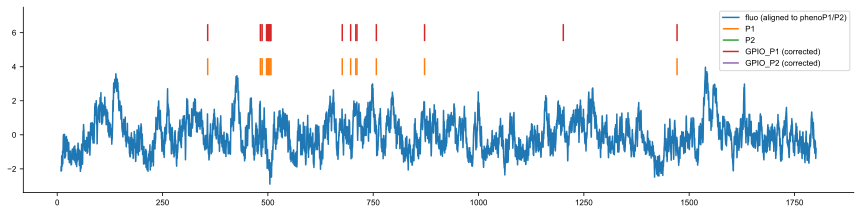

 30%|███       | 6/20 [00:35<01:15,  5.38s/it]

frame diff: 0.04996
20 Hz -> 10 Hz
saved: SNA091599 21.10.15
SNA091599 21.10.18
time difference: -5.865000000000009
num of neurons: 1


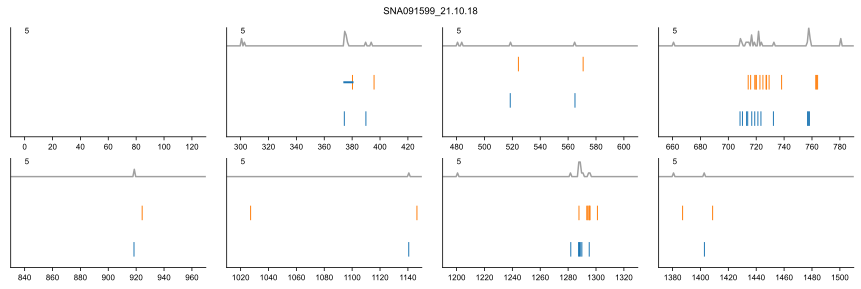

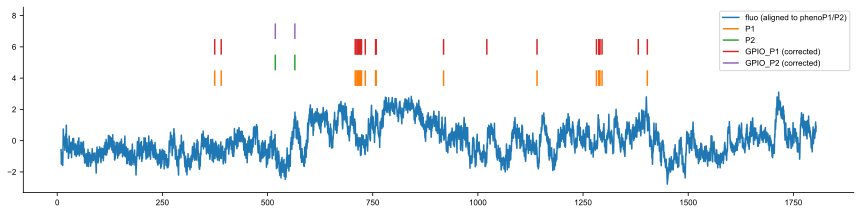

 35%|███▌      | 7/20 [00:40<01:07,  5.20s/it]

frame diff: 0.04996
20 Hz -> 10 Hz
saved: SNA091599 21.10.18
SNA091599 21.10.19
time difference: -8.902000000000001
num of neurons: 1


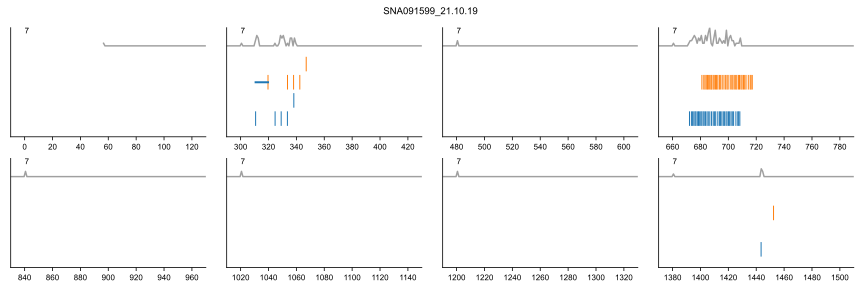

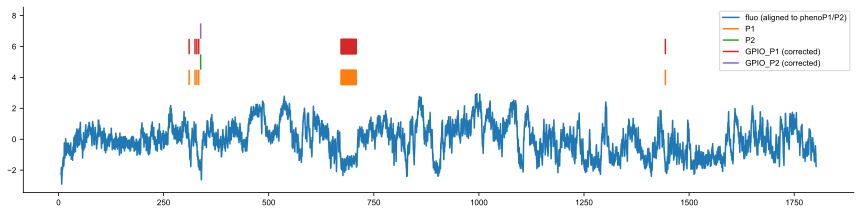

 40%|████      | 8/20 [00:44<01:00,  5.05s/it]

frame diff: 0.04996
20 Hz -> 10 Hz
saved: SNA091599 21.10.19
SNA091599 21.10.20
time difference: -6.337000000000003
num of neurons: 1


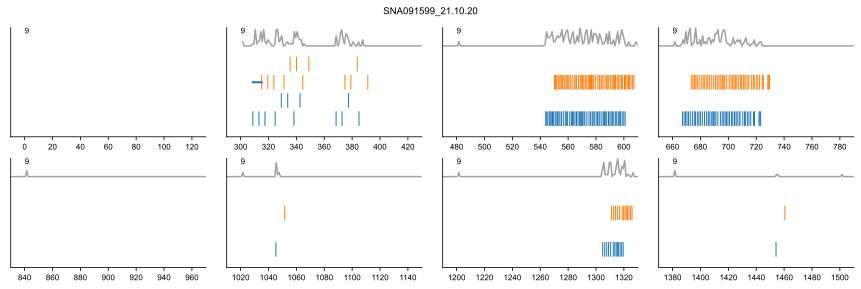

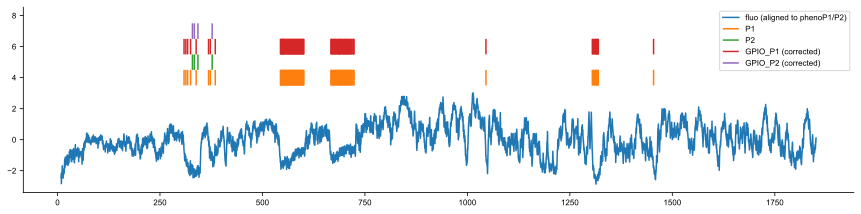

 45%|████▌     | 9/20 [00:49<00:55,  5.08s/it]

frame diff: 0.04996
20 Hz -> 10 Hz
saved: SNA091599 21.10.20
SNA091599 21.10.22
time difference: -10.227000000000004
num of neurons: 1


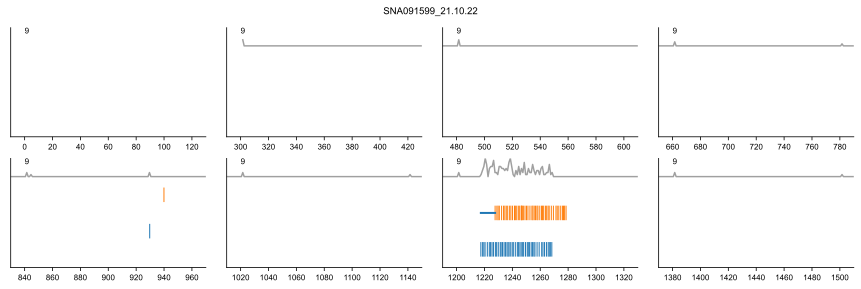

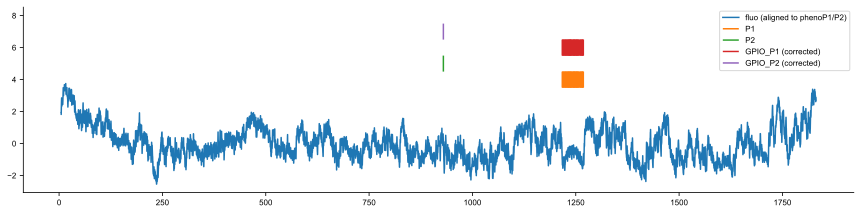

 50%|█████     | 10/20 [00:55<00:52,  5.21s/it]

frame diff: 0.04996
20 Hz -> 10 Hz
no binge somehow
saved: SNA091599 21.10.22
SNA091599 21.10.25
time difference: -6.376000000000005
num of neurons: 1


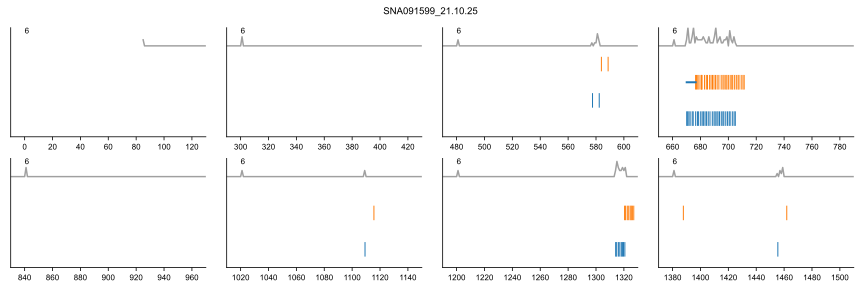

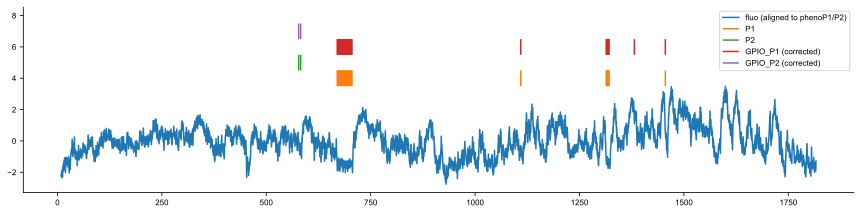

 55%|█████▌    | 11/20 [01:00<00:46,  5.17s/it]

frame diff: 0.04996
20 Hz -> 10 Hz
saved: SNA091599 21.10.25
SNA091599 21.10.26
time difference: -7.047000000000011
num of neurons: 1


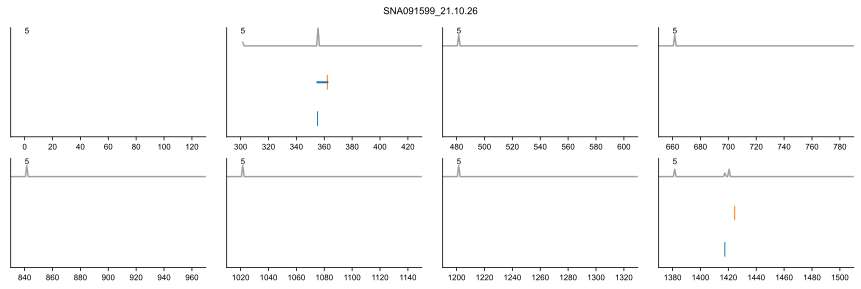

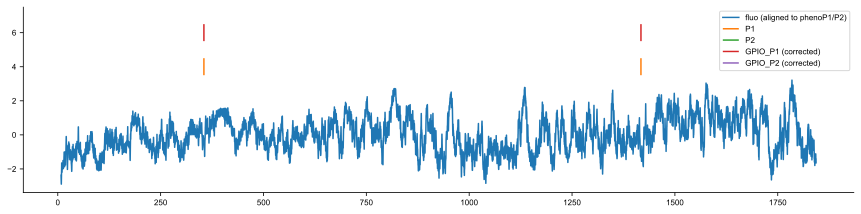

 60%|██████    | 12/20 [01:05<00:41,  5.18s/it]

frame diff: 0.04996
20 Hz -> 10 Hz
no binge somehow
saved: SNA091599 21.10.26
SNA091599 21.10.27
time difference: -4.969000000000008
num of neurons: 1


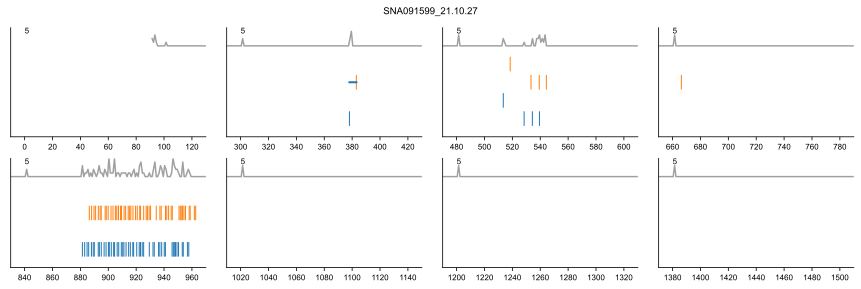

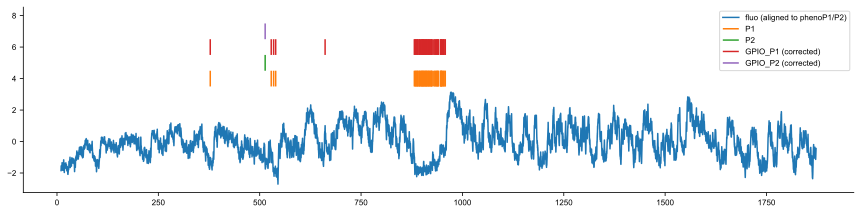

 65%|██████▌   | 13/20 [01:11<00:36,  5.26s/it]

frame diff: 0.04996
20 Hz -> 10 Hz
saved: SNA091599 21.10.27
SNA091600 21.10.11
time difference: -9.025000000000006
num of neurons: 1


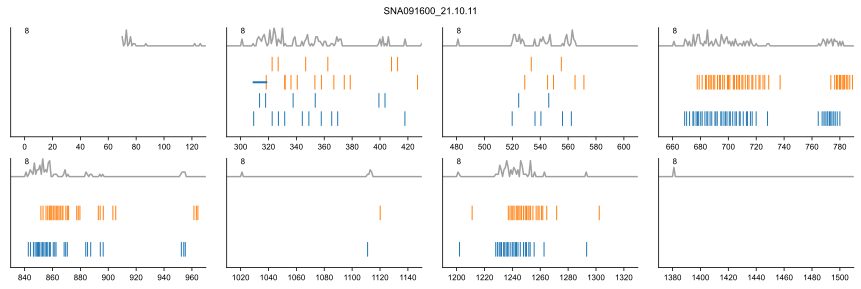

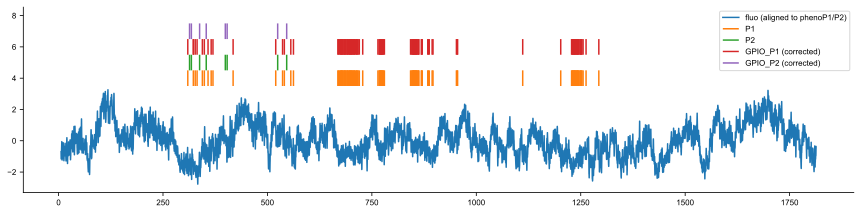

 70%|███████   | 14/20 [01:16<00:31,  5.32s/it]

frame diff: 0.04996
20 Hz -> 10 Hz
saved: SNA091600 21.10.11
SNA091600 21.10.12
time difference: -10.24900000000001
num of neurons: 1


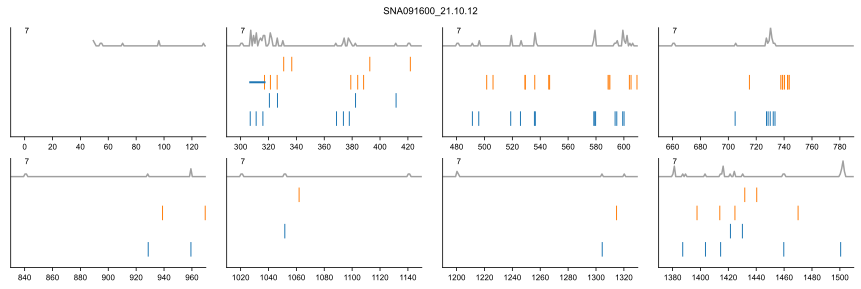

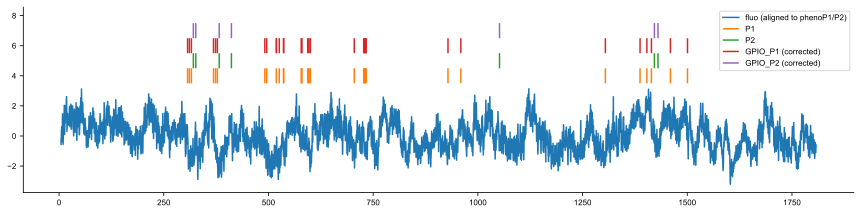

 75%|███████▌  | 15/20 [01:21<00:26,  5.24s/it]

frame diff: 0.04996
20 Hz -> 10 Hz
saved: SNA091600 21.10.12
SNA091600 21.10.13
time difference: -6.568000000000012
num of neurons: 1


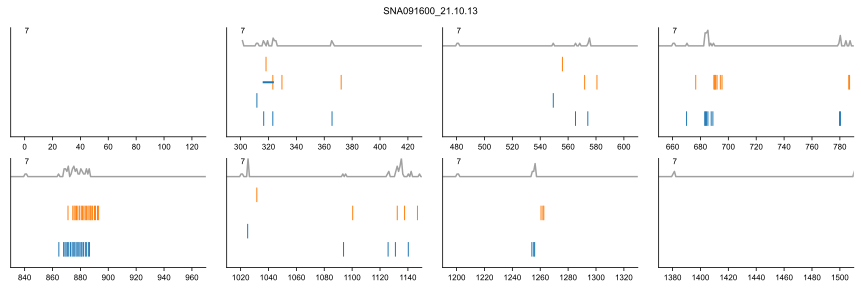

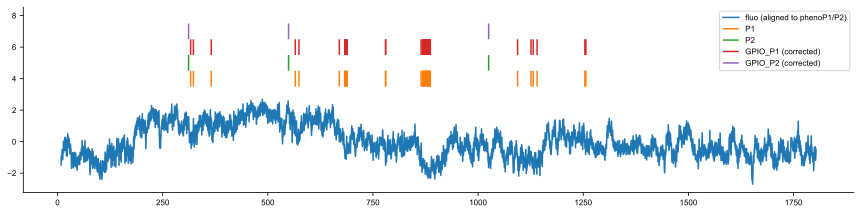

 80%|████████  | 16/20 [01:27<00:21,  5.34s/it]

frame diff: 0.04996
20 Hz -> 10 Hz
saved: SNA091600 21.10.13
SNA091600 21.10.14
time difference: -10.14800000000001
num of neurons: 1


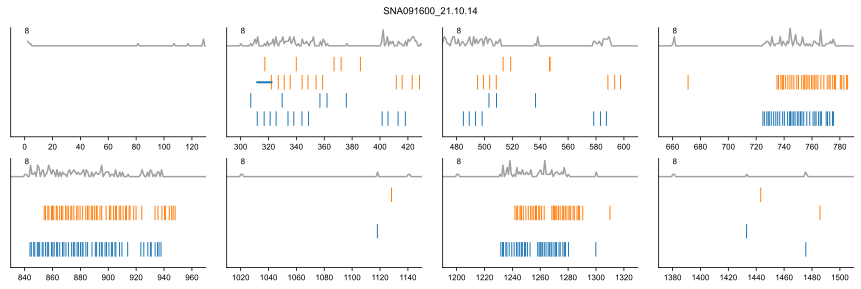

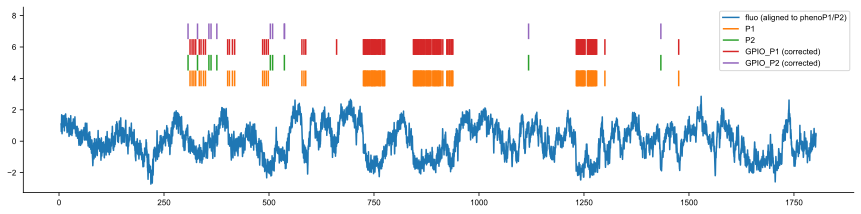

 85%|████████▌ | 17/20 [01:32<00:15,  5.31s/it]

frame diff: 0.04996
20 Hz -> 10 Hz
saved: SNA091600 21.10.14
SNA091600 21.10.15
time difference: -8.766000000000005
num of neurons: 1


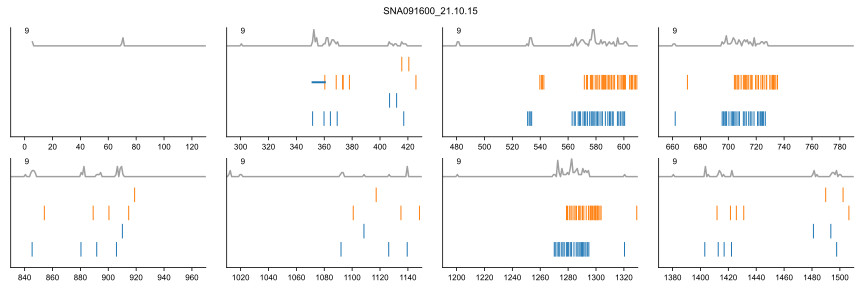

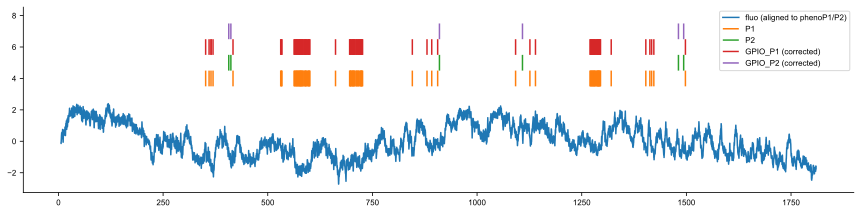

 90%|█████████ | 18/20 [01:37<00:10,  5.15s/it]

frame diff: 0.04996
20 Hz -> 10 Hz
saved: SNA091600 21.10.15
SNA091600 21.10.18
time difference: -9.234000000000009
num of neurons: 1


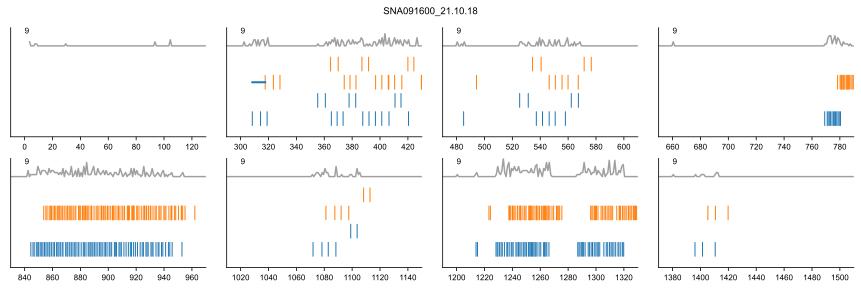

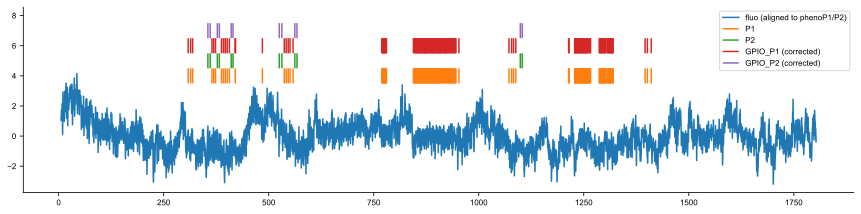

 95%|█████████▌| 19/20 [01:42<00:05,  5.11s/it]

frame diff: 0.04996
20 Hz -> 10 Hz
saved: SNA091600 21.10.18
SNA091600 21.10.19
time difference: -9.949000000000012
num of neurons: 1


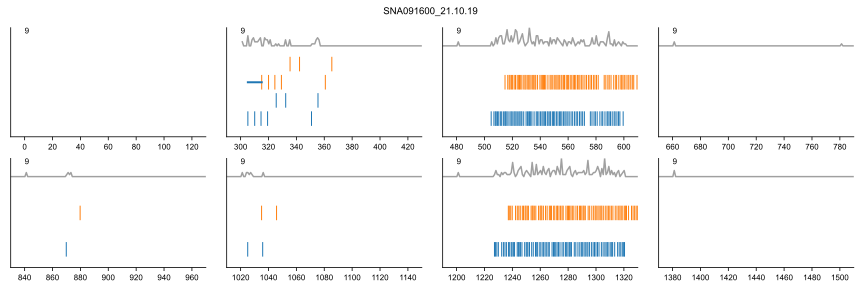

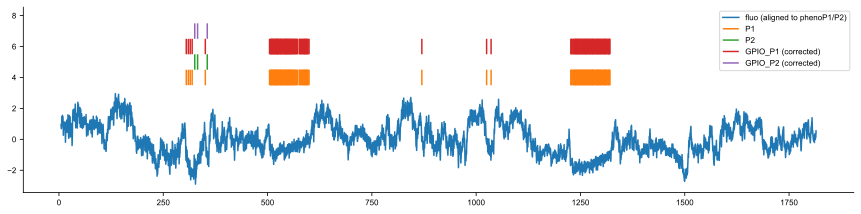

100%|██████████| 20/20 [01:47<00:00,  5.38s/it]

frame diff: 0.04996
20 Hz -> 10 Hz
saved: SNA091600 21.10.19
All done!


In [6]:
## load inscopix & phenosys data

Phenosys_folder = '/Users/hunglo/Documents/inscopix_csv/Phenosys_csv/'
extension = 'csv'
os.chdir(Phenosys_folder)
result = sorted(glob.glob('*.{}'.format(extension)))

result = [r for r in result if 'SNA' in r] # include only sero & dopa data

## loop through all files
for file_path in tqdm(result[20:40]):
  file_path = os.path.join(Phenosys_folder,file_path)
  mouse_id = file_path.split('_Inscopix-')[0].split('/')[-1]
  date     = file_path.split('_Inscopix-')[1].split('_')[0]
  print(mouse_id,date)
  L1,P1,P2,PAll = binge.load_phenosys(file_path)
  L1 = np.pad(L1, (0, 1), 'constant', constant_values=(np.nan,3000)) ## add a very far lick event to prevent a conditional error later for excluding no lick slow events
  L1_,P1_,P2_,PAll_ = binge.load_phenosys_nofilter(file_path)

  PETH_lick_slow, PETH_pump_slow = {},{}
  PETH_lick_binge, PETH_pump_binge = {},{}
  PETH_trace_binge_on,PETH_trace_binge_off = {},{}
  PETH_trace_milk,PETH_trace_water = {},{}

  ## make a condition here to check if we have the corresponding Ca2+
  df_accepted, df_z, time_difference = binge.loadandsync_incopix_csv(file_path,mouse_id)

  if True:
    # binge.pheno_eventplot(P1,P2,PAll,P1_,P2_,PAll_,L1,mouse_id,date)
    # binge.pheno_lick_eventplot(L1,L1_,PAll,mouse_id,date)
    df_GPIO = binge.load_GPIO_csv(file_path)
    GPIO_pump1_clean, GPIO_pump2_clean, GPIO_pump_all_no_init=binge.extract_GPIO_trace(df_GPIO,plot=False)
    binge.pheno_eventplot(P1,P2,PAll,GPIO_pump1_clean, GPIO_pump2_clean, GPIO_pump_all_no_init,L1,mouse_id,date,time_difference)

    plt.figure(figsize=[12,3])
    plt.plot(df_z,label='fluo (aligned to phenoP1/P2)')
    plt.eventplot(P1,lineoffsets=4,color='C1',label='P1')
    plt.eventplot(P2,lineoffsets=5,color='C2',label='P2')
    plt.eventplot(GPIO_pump1_clean+time_difference,lineoffsets=6,color='C3',label='GPIO_P1 (corrected)')
    plt.eventplot(GPIO_pump2_clean+time_difference,lineoffsets=7,color='C4',label='GPIO_P2 (corrected)')
    sns.despine()
    plt.tight_layout()
    plt.legend()
    plt.show()

  ## check if there is no drinking events
  if len(PAll)==0:
    print(f'There isnt a feeding event in this {mouse_id}_{date} recording, pass!')
    print('=======================================================')
    continue

  interval = 3
  binge_epoch, not_binge_epoch = [],[]

  binge_epoch = detect_binge_bout(P1,interval=interval)

  not_binge_epoch = nap.IntervalSet(0,PAll[-1]+50).set_diff(binge_epoch)  
  # print(not_binge_epoch)
  not_binge_epoch['start'] = not_binge_epoch['start']+0.2 # to exclude boundary events
  not_binge_epoch['end']   = not_binge_epoch['end']-0.2   # to exclude boundary events

  slow_milk_ts  = nap.Ts(P1).restrict(not_binge_epoch).index # get all other events as slow
  slow_water_ts = nap.Ts(P2).restrict(not_binge_epoch).index

  # check there is licking after the delivery in 4 sec
  slow_milk_ts_clean  = np.array([t for t in slow_milk_ts if (L1[L1>t][0]-t) <4])
  # print(len(slow_milk_ts_clean))
  slow_milk_ts_clean = np.pad(slow_milk_ts_clean,(0,1),'constant', constant_values=(4000,))
  slow_milk_ts_clean = np.sort(slow_milk_ts_clean)
  slow_milk_ts_clean  = np.array([x for x,y in zip(slow_milk_ts_clean[:-1],slow_milk_ts_clean[1:]) if (y-x) > 3.5]) # exclude slow feeding events that come from incomplete binge feeding
  # print(len(slow_milk_ts_clean))
  slow_water_ts_clean = np.array([t for t in slow_water_ts if (L1[L1>t][0]-t) <4])
  slow_water_ts_clean = np.pad(slow_water_ts_clean,(0,1),'constant', constant_values=(4000,))
  slow_water_ts_clean = np.sort(slow_water_ts_clean)
  slow_water_ts_clean = np.array([x for x,y in zip(slow_water_ts_clean[:-1],slow_water_ts_clean[1:]) if (y-x) > 3.5]) # exclude slow feeding events that come from incomplete binge feeding
  # print(len(slow_water_ts_clean))
  all_slow_events = sorted(np.concatenate([slow_milk_ts_clean,slow_water_ts_clean]))
  all_slow_events = np.pad(all_slow_events, (1,), 'constant', constant_values=(0,)) # pad a zero here
  all_slow_events = np.sort(all_slow_events)
  interval_slow_onset = 8 # sec, setting how far is the preceding pump event
  slow_feeding_onset  = np.array([y for x,y in zip(all_slow_events[:-1],all_slow_events[1:]) if (y-x) > interval_slow_onset])
#   print(len(slow_feeding_onset))
  # slow_feeding_onset  = np.array([x for x,y in zip(slow_feeding_onset[:-1],slow_feeding_onset[1:]) if (y-x) >3.5]) # exclude slow feeding events that come from incomplete binge feeding
  # slow_feeding_onset  = np.array([x for x in slow_feeding_onset if (L1[L1>x][0]-x)<8])
  slow_feeding_onset_water  = np.array([x for x in slow_feeding_onset if x in slow_water_ts]) # keep only the water ones
  slow_feeding_onset_milk   = np.array([x for x in slow_feeding_onset if x in slow_milk_ts]) # keep only the milk ones

#   df_downsampled   = downsample(df_accepted)
  df_downsampled_z = downsample(df_z)

  window = 1 # sec for baseline correction

  # if there is no slow eating event
  if len(slow_milk_ts_clean)==0:
     PETH_trace_milk = {}
  else:
     PETH_trace_milk = get_PETH_dict(df_downsampled_z,slow_milk_ts_clean)
     PETH_trace_milk_raw = PETH_trace_milk.copy()
     PETH_trace_milk  = baseline_correct(PETH_trace_milk,window=window)

  # get slow feeding onset PETH
  if len(slow_feeding_onset_milk)==0:
     PETH_trace_milk_onset = {}
  else:
     PETH_trace_milk_onset = get_PETH_dict(df_downsampled_z,slow_feeding_onset_milk)
     PETH_trace_milk_onset_raw = PETH_trace_milk_onset.copy()
     PETH_trace_milk_onset  = baseline_correct(PETH_trace_milk_onset,window=window)
  # slow feeding onset water
  if len(slow_feeding_onset_water)==0:
     PETH_trace_water_onset = {}
     PETH_trace_water_onset_raw = {}
  else:
     PETH_trace_water_onset = get_PETH_dict(df_downsampled_z,slow_feeding_onset_water)
     PETH_trace_water_onset_raw = PETH_trace_water_onset.copy()
     PETH_trace_water_onset  = baseline_correct(PETH_trace_water_onset,window=window)

  if len(slow_water_ts_clean)==0:
      PETH_trace_water = {}
      PETH_trace_water_raw = {}

  else:
      PETH_trace_water = get_PETH_dict(df_downsampled_z,slow_water_ts_clean)
      PETH_trace_water_raw = PETH_trace_water.copy()
      PETH_trace_water = baseline_correct(PETH_trace_water,window=window)

  if binge_epoch.shape[0] == 0:
      PETH_trace_binge_on,PETH_trace_binge_off = {},{}
      print('no binge somehow')
  else:
      PETH_trace_binge_on,PETH_trace_binge_off = get_PETH_binge(df_downsampled_z,binge_epoch)
      PETH_trace_binge_on_raw = PETH_trace_binge_on.copy()
      PETH_trace_binge_off_raw = PETH_trace_binge_off.copy()
      PETH_trace_binge_on  = baseline_correct(PETH_trace_binge_on,window=window)
      PETH_trace_binge_off = baseline_correct(PETH_trace_binge_off,window=window)

  # get lick & pump events around slow/binge feeding onsets, using nap fuctions
  minmax = (-5,5)
  PETH_lick_slow       = nap.compute_perievent(data=nap.Ts(L1,time_units='s'), tref=nap.Ts(slow_feeding_onset_milk,time_units='s'), minmax=minmax, time_unit='s')
  PETH_lick_binge      = nap.compute_perievent(data=nap.Ts(L1,time_units='s'), tref=nap.Ts(binge_epoch['start'].values,time_units='s'), minmax=minmax, time_unit='s')
  PETH_lick_slow_water = nap.compute_perievent(data=nap.Ts(L1,time_units='s'), tref=nap.Ts(slow_feeding_onset_water,time_units='s'), minmax=minmax, time_unit='s')
  PETH_lick_slow_single = nap.compute_perievent(data=nap.Ts(L1,time_units='s'), tref=nap.Ts(slow_milk_ts_clean,time_units='s'), minmax=minmax, time_unit='s')
  PETH_lick_slow_single_water = nap.compute_perievent(data=nap.Ts(L1,time_units='s'), tref=nap.Ts(slow_water_ts_clean,time_units='s'), minmax=minmax, time_unit='s')

  minmax = (-5,15)
  PETH_pump_slow       = nap.compute_perievent(data=nap.Ts(slow_milk_ts_clean,time_units='s'), tref=nap.Ts(slow_feeding_onset_milk,time_units='s'), minmax=minmax, time_unit='s')
  PETH_pump_binge      = nap.compute_perievent(data=nap.Ts(P1,time_units='s'), tref=nap.Ts(binge_epoch['start'].values,time_units='s'), minmax=minmax, time_unit='s')
  PETH_pump_slow_water = nap.compute_perievent(data=nap.Ts(slow_water_ts_clean,time_units='s'), tref=nap.Ts(slow_feeding_onset_water,time_units='s'), minmax=minmax, time_unit='s')

  ## get metadata for saving
  Pump1_solution, Pump2_solution, Food_deprivation, Genotype, mouse_name = get_metadata(mouse_id, date)

  ## initiate a dict for saving npy
  dat = {}
  dat['PETH_binge_on']              = PETH_trace_binge_on
  dat['PETH_binge_off']             = PETH_trace_binge_off
  dat['PETH_binge_on_raw']          = PETH_trace_binge_on_raw
  dat['PETH_binge_off_raw']         = PETH_trace_binge_off_raw
  
  dat['PETH_slow_milk']             = PETH_trace_milk
  dat['PETH_slow_water']            = PETH_trace_water
  dat['PETH_slow_milk_onset']       = PETH_trace_milk_onset
  dat['PETH_slow_water_onset']      = PETH_trace_water_onset
  dat['PETH_slow_milk_raw']         = PETH_trace_milk_raw
  dat['PETH_slow_water_raw']        = PETH_trace_water_raw
  dat['PETH_slow_milk_onset_raw']   = PETH_trace_milk_onset_raw
  dat['PETH_slow_water_onset_raw']  = PETH_trace_water_onset_raw

  dat['slow_milk_pump']             = slow_milk_ts_clean
  dat['slow_water_pump']            = slow_water_ts_clean
  dat['binge_milk_pump']            = nap.Ts(P1).restrict(binge_epoch).index
  dat['Binge_epoch']                = binge_epoch
  dat['slow_feeding_onset']         = slow_feeding_onset
  dat['PETH_lick_slow']             = PETH_lick_slow
  dat['PETH_lick_slow_single']      = PETH_lick_slow_single
  dat['PETH_lick_binge']            = PETH_lick_binge
  dat['PETH_lick_slow_water']       = PETH_lick_slow_water
  dat['PETH_lick_slow_single_water']= PETH_lick_slow_single_water
  dat['PETH_pump_slow']             = PETH_pump_slow
  dat['PETH_pump_binge']            = PETH_pump_binge
  dat['PETH_pump_slow_water']       = PETH_pump_slow_water
#   dat['neuron_data']                = df_accepted
  dat['neuron_data_z']              = df_z

  dat['mouse_name']                 = mouse_name
  dat['mouse_id']                   = mouse_id
  dat['cell_type']                  = Genotype
  dat['date_exp']                   = date.replace(".", "") # save with no dot, so it's YYMMDD
  dat['pump_solution']              = (Pump1_solution, Pump2_solution)
  dat['dt']                         = 0.10 # second, delta t for each frame, notice we downsampled it from 20 Hz -> 10 Hz
  dat['food_deprivation_level']     = Food_deprivation

  output_file_name = f'/Users/hunglo/Documents/inscopix_csv/processed_npy/{mouse_id}_{date}_{Genotype}_{Pump1_solution}_{Pump2_solution}_{Food_deprivation}.npy'
  np.save(output_file_name, dat)
  print(f'saved: {mouse_id} {date}')
  print('=======================================================')

print('All done!')


  0%|          | 0/1 [00:00<?, ?it/s]

SNA110215 23.01.13
time difference: -7.1000000000000085


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]

num of neurons: 1


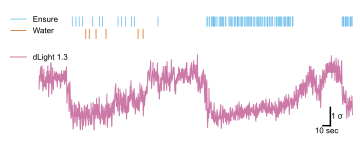

In [128]:
## plot dopamine example trace

Phenosys_folder = '/Users/hunglo/Documents/inscopix_csv/Phenosys_csv/'
extension = 'csv'
os.chdir(Phenosys_folder)
result = sorted(glob.glob('*.{}'.format(extension)))

result = [r for r in result if 'SNA' in r] # include only sero & dopa data
result = [r for r in result if 'SNA110215_Inscopix-23.01.13_' in r]
## loop through all files
for file_path in tqdm(result[:]):

    file_path = os.path.join(Phenosys_folder,file_path)
    mouse_id = file_path.split('_Inscopix-')[0].split('/')[-1]
    date     = file_path.split('_Inscopix-')[1].split('_')[0]
    print(mouse_id,date)
    L1,P1,P2,PAll = binge.load_phenosys(file_path)
    L1 = np.pad(L1, (0, 1), 'constant', constant_values=(np.nan,3000)) ## add a very far lick event to prevent a conditional error later for excluding no lick slow events
    L1_,P1_,P2_,PAll_ = binge.load_phenosys_nofilter(file_path)

    PETH_lick_slow, PETH_pump_slow = {},{}
    PETH_lick_binge, PETH_pump_binge = {},{}
    PETH_trace_binge_on,PETH_trace_binge_off = {},{}
    PETH_trace_milk,PETH_trace_water = {},{}

    ## make a condition here to check if we have the corresponding Ca2+
    df_accepted, df_z, time_difference = binge.loadandsync_incopix_csv(file_path,mouse_id)


    fig, axes = plt.subplots(nrows=2,figsize=[5,2], gridspec_kw={'height_ratios': [1, 2],'hspace':0},sharex=True)
    axes[0].eventplot([P1,P2],colors=[my_color_map[0],my_color_map[5]],linewidths=0.7, linelength=0.8,alpha=1,lineoffsets=[0,-1])

    axes[1].plot(df_z,c=my_color_map[6],label='dLight 1.3',lw=1)
    axes[1].legend(frameon=False,loc=[-0.1,0.8])
    axes[1].set_ylim(ymax=2.25,ymin=-2.25)
    # axes[1].set_ylim(ymax=2.2,ymin=0)
    labels=['Ensure','Water']
    axes[0].legend(labels,frameon=False,fontsize=8,loc=[-0.1,0.25])

    axes[0].set_axis_off()
    axes[1].set_axis_off()
    # sns.despine(ax=axes[0],left=True,bottom=True)
    # sns.despine(ax=axes[1],left=True,bottom=True)
    # axes[1].set_xlabel('Time (second)')
    # axes[1].set_ylabel('A.U.-zscored')

    x_offset = 640

    axes[1].plot([x_offset,x_offset+10],[-2,-2],color='k')
    axes[1].plot([x_offset+10,x_offset+10],[-2,-1],color='k')
    axes[1].text(x_offset+5,-2.1,s='10 sec',ha='center',va='top')
    axes[1].text(x_offset+11,-1.5,s='1 \u03C3',ha='left',va='center')
    

    # plt.xlim([470,770])
    # plt.xlim([280,650])
    # plt.xlim([430,610])
    plt.xlim([260,680])
    # plt.xlim([800,980])
    # plt.xlim([625,1000])

    plt.tight_layout()
    plot_name = '4_dopa_example_trace'
    save_plot_pdf(plot_name)


  0%|          | 0/1 [00:00<?, ?it/s]

SNA091599 21.10.20
time difference: -6.337000000000003


100%|██████████| 1/1 [00:03<00:00,  3.56s/it]

num of neurons: 1


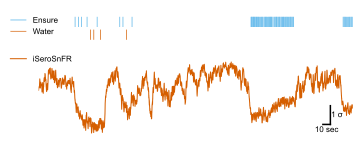

In [147]:
## plot dopamine example trace

Phenosys_folder = '/Users/hunglo/Documents/inscopix_csv/Phenosys_csv/'
extension = 'csv'
os.chdir(Phenosys_folder)
result = sorted(glob.glob('*.{}'.format(extension)))

result = [r for r in result if 'SNA' in r] # include only sero & dopa data
result = [r for r in result if 'SNA091599_Inscopix-21.10.20_' in r]

## loop through all files
for file_path in tqdm(result[:]):

    file_path = os.path.join(Phenosys_folder,file_path)
    mouse_id = file_path.split('_Inscopix-')[0].split('/')[-1]
    date     = file_path.split('_Inscopix-')[1].split('_')[0]
    print(mouse_id,date)
    L1,P1,P2,PAll = binge.load_phenosys(file_path)
    L1 = np.pad(L1, (0, 1), 'constant', constant_values=(np.nan,3000)) ## add a very far lick event to prevent a conditional error later for excluding no lick slow events
    L1_,P1_,P2_,PAll_ = binge.load_phenosys_nofilter(file_path)

    PETH_lick_slow, PETH_pump_slow = {},{}
    PETH_lick_binge, PETH_pump_binge = {},{}
    PETH_trace_binge_on,PETH_trace_binge_off = {},{}
    PETH_trace_milk,PETH_trace_water = {},{}

    ## make a condition here to check if we have the corresponding Ca2+
    df_accepted, df_z, time_difference = binge.loadandsync_incopix_csv(file_path,mouse_id)

    fig, axes = plt.subplots(nrows=2,figsize=[5,2], gridspec_kw={'height_ratios': [1, 2],'hspace':0},sharex=True)

    axes[0].eventplot([P1,P2],colors=[my_color_map[0],my_color_map[5]],linewidths=0.7, linelength=0.8,alpha=1,lineoffsets=[0,-1])

    axes[1].plot(df_z,c=my_color_map[5],label='iSeroSnFR',lw=1)
    axes[1].legend(frameon=False,loc=[-0.1,0.8])
    axes[1].set_ylim(ymax=2,ymin=-2.5)
    # axes[1].set_ylim(ymax=2.2,ymin=0)
    labels=['Ensure','Water']
    axes[0].legend(labels,frameon=False,fontsize=8,loc=[-0.1,0.25])

    axes[0].set_axis_off()
    axes[1].set_axis_off()
    # sns.despine(ax=axes[0],left=True,bottom=True)
    # sns.despine(ax=axes[1],left=True,bottom=True)
    # axes[1].set_xlabel('Time (second)')
    # axes[1].set_ylabel('A.U.-zscored')

    x_offset = 640

    axes[1].plot([x_offset,x_offset+10],[-2,-2],color='k')
    axes[1].plot([x_offset+10,x_offset+10],[-2,-1],color='k')
    axes[1].text(x_offset+5,-2.1,s='10 sec',ha='center',va='top')
    axes[1].text(x_offset+11,-1.5,s='1 \u03C3',ha='left',va='center')
    

    # plt.xlim([470,770])
    # plt.xlim([280,650])
    # plt.xlim([430,610])
    plt.xlim([260,680])
    # plt.xlim([800,980])
    # plt.xlim([625,1000])

    plt.tight_layout()
    plot_name = '4_serotonin_example_trace'
    save_plot_pdf(plot_name)


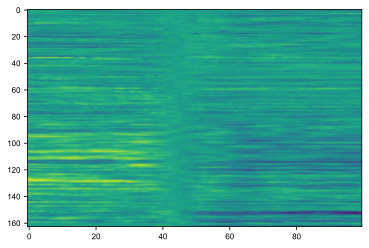

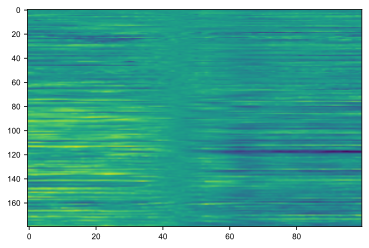

In [148]:
## loop all npy for serotonin

def load_npy(file_path):
    dat = np.load(file_path, allow_pickle=True)
    PETH_binge_on   = dict2np(dat.item().get('PETH_binge_on'))
    PETH_slow_milk_onset  = dict2np(dat.item().get('PETH_slow_milk_onset'))

    return PETH_binge_on, PETH_slow_milk_onset

def dict2np(PETH):
    keys = list(PETH.keys())
    if len(keys) == 0:
        return None
    else:
        dat_temp = PETH.get(keys[0])
        PETH_new = np.zeros((len(keys),dat_temp.shape[0],dat_temp.shape[1]))
        for idx,cell in enumerate(keys):
            PETH_new[idx,:,:] = PETH[cell]
        return PETH_new

file_folder = '/Users/hunglo/Documents/inscopix_csv/processed_npy/'
extension = 'npy'
os.chdir(file_folder)
result = sorted(glob.glob('*.{}'.format(extension)))
image_type = 'Sero'
image_type = 'dLight'

result = [r for r in result if image_type in r] # select serotonin data

# print(result)

PETH_binge_on_concat = np.zeros([1,100])
PETH_slow_milk_onset_concat = np.zeros([1,100])
for r in result:
    # print(r)
    file_path = os.path.join(file_folder,r)
    PETH_binge_on, PETH_slow_milk_onset = load_npy(file_path)
    if PETH_binge_on is None:
        print(f'no binge event, skip {r}')
        continue
    if PETH_slow_milk_onset is None:
        print(f'no slow event, skip {r}')
        continue
    ## only process the session where we have slow and binge events
    # PETH_avg = []
    # PETH_avg = np.mean(PETH_binge_on,axis=1) # trial average
    # PETH_binge_on_concat = np.vstack([PETH_binge_on_concat,PETH_avg])
    PETH_binge_on_concat = np.vstack([PETH_binge_on_concat,PETH_binge_on[0,:,:]])# don't average, keep individual trials
    # PETH_avg = []
    # PETH_avg = np.mean(PETH_slow_milk_onset,axis=1) # trial average
    # PETH_slow_milk_onset_concat = np.vstack([PETH_slow_milk_onset_concat,PETH_avg])
    PETH_slow_milk_onset_concat = np.vstack([PETH_slow_milk_onset_concat,PETH_slow_milk_onset[0,:,:]])# don't average, keep individual trials

PETH_binge_on_concat = PETH_binge_on_concat[~np.all(PETH_binge_on_concat == 0, axis=1)] # remove first row
PETH_slow_milk_onset_concat = PETH_slow_milk_onset_concat[~np.all( PETH_slow_milk_onset_concat == 0, axis=1)] # remove first row

plt.imshow(PETH_binge_on_concat,aspect='auto')
plt.show()
plt.imshow(PETH_slow_milk_onset_concat,aspect='auto')
plt.show()




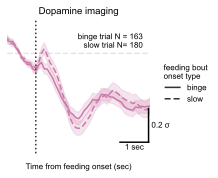

In [149]:
## plot trial average line plot with stats and decoration

def np2df_long(PETH_binge_on_concat):
    df_ = pd.DataFrame(PETH_binge_on_concat)
    df_long = pd.melt(df_.reset_index(),id_vars='index',value_name='zs-dff',var_name='Time (sec)')
    df_long['Time (sec)']=(df_long['Time (sec)'].values/10)-5
    return df_long
df_binge = np2df_long(PETH_binge_on_concat)
df_binge['feeding type'] = 'binge'
df_slow = np2df_long(PETH_slow_milk_onset_concat)
df_slow['feeding type'] = 'slow'

df_merge = pd.concat([df_binge,df_slow]).reset_index(drop=True)
df_merge



def deco_sns(data, **kws):
    n_binge = len(data[data['feeding type']=='binge']['index'].unique())
    n_slow  = len(data[data['feeding type']=='slow']['index'].unique())
    ax = plt.gca()
    ax.axvline(x=0,ls=':',color='k',alpha=0.5)
    ax.text(.95,.9,f'binge trial N = {n_binge}\nslow trial N= {n_slow}',transform=ax.transAxes,ha='right',va='top') # annotate n number, no % for all neurons

def deco_stats(data,**kws):
    t_sign_05 = get_qvalue(data,threshold_q=0.05)
    t_sign_01 = get_qvalue(data,threshold_q=0.01)
    t_sign_001 = get_qvalue(data,threshold_q=0.001)
    ax = plt.gca()
    ymax = ax.get_ylim()[1]
    for t in t_sign_05:
        ax.plot([t-0.025,t+0.025],[ymax*0.95,ymax*0.95],color='k',alpha=0.3,lw=1)
    for t in t_sign_01:
        ax.plot([t-0.025,t+0.025],[ymax*0.95,ymax*0.95],color='k',alpha=0.6,lw=1.5)
    for t in t_sign_001:
        ax.plot([t-0.025,t+0.025],[ymax*0.95,ymax*0.95],color='k',alpha=1,lw=2)
    ax.set_xlim(xmin=-1)

def get_qvalue(data, threshold_q=0.05):
    from scipy import stats
    from statsmodels.stats.multitest import fdrcorrection
    # threshold_q=threshold_q/4 # in case we need to account for 4 clusters of neurons
    t_sign = []
    p_concat = []
    slow_data = data[data['feeding type']=='slow']
    binge_data = data[data['feeding type']=='binge']
    for t in data['Time (sec)'].unique():
        slow_value  = slow_data[slow_data['Time (sec)']==t]['zs-dff'].values
        binge_value = binge_data[binge_data['Time (sec)']==t]['zs-dff'].values
        p_val = stats.ttest_ind(slow_value, binge_value, equal_var=False)[1]
        p_concat.append(p_val)
    rejected, q_value = fdrcorrection(np.array(p_concat),method='poscorr')
    adj_p_sign_idx = q_value<threshold_q
    # t_scale = np.arange(-0.9,5,0.1)
    t_scale = np.arange(-5,5,0.1)
    t_sign = t_scale[adj_p_sign_idx]

    return t_sign

def deco_scale(data,**kws):
    ax = plt.gca()
    yticks = ax.get_yticks()
    yunit = yticks[1]-yticks[0]
    yunit = round(yunit,2)
    # if yunit>0.1:
    #     yunit=0.1
    # # if yunit >0.1:
    # #     yunit=0.1 # shrink it?
    ylims = ax.get_ylim()
    x_offset = 0.05
    # y_bottom,y_top = yticks[0], yticks[0]+yunit
    y_bottom,y_top = ylims[0], ylims[0]+yunit
    ax.plot([4-x_offset,4-x_offset],[y_bottom,y_top],c='k')
    ax.text(4.1-x_offset,y_bottom+yunit/2,f'{yunit} \u03C3',va='center',ha='left') # \u03C3 is sigma=sd
    ax.plot([3-x_offset,4-x_offset],[y_bottom,y_bottom],c='k')
    ax.text(3.5-x_offset,y_bottom-0.01,'1 sec',ha='center',va='top')
    # ax.set_axis_off()
    ax.get_yaxis().set_visible(False)
    ax.get_xaxis().set_ticks([])
    ax.set_xlabel('Time from milk delivery (sec)',labelpad=10)
    sns.despine(bottom=True,left=True,ax=ax)

data = df_merge.copy()
if image_type == 'Sero':
    title_name = 'Serotonin imaging'
    color = my_color_map_grey[6]

elif image_type == 'dLight':
    title_name = 'Dopamine imaging'
    color = my_color_map_grey[7]

g = sns.relplot(data=data,x='Time (sec)',y='zs-dff',kind='line',
                style='feeding type',style_order = ['binge','slow'], color=color,
                height=2.5,aspect=1,errorbar='se',dashes=[(1,0),(4,2)],facet_kws=dict(legend_out=False)).set(title=f'{title_name}')

g.map_dataframe(deco_sns)
g.map_dataframe(deco_stats)
g.map_dataframe(deco_scale)
g.set_xlabels('Time from feeding onset (sec)')
plt.xlim([-1,4])
if image_type == 'Sero':
    plt.ylim([-0.7,0.2])
elif image_type == 'dLight':
    plt.ylim([-0.6,0.2])
g.refline(x=0,ls=':',color='k',alpha=0.5,zorder=-100)
g.refline(y=0,color='grey',alpha=0.2,zorder=-100)
sns.move_legend(g,frameon=False,loc=(0,0),bbox_to_anchor=(0.9, 0.4),title='feeding bout\nonset type')

plot_name = f'4_{title_name}_average_traces'
save_plot_pdf(plot_name)



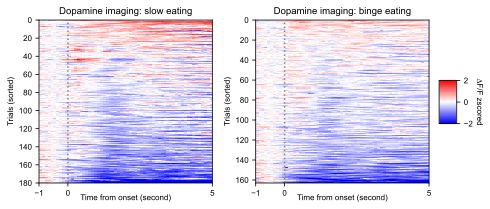

In [150]:
## heatmap for slow and binge eating for modulator imaging

class MidpointNormalize(mpl.colors.Normalize):
    def __init__(self, vmin, vmax, midpoint=0, clip=False):
        self.midpoint = midpoint
        mpl.colors.Normalize.__init__(self, vmin, vmax, clip)

    def __call__(self, value, clip=None):
        normalized_min = max(0, 1 / 2 * (1 - abs((self.midpoint - self.vmin) / (self.midpoint - self.vmax))))
        normalized_max = min(1, 1 / 2 * (1 + abs((self.vmax - self.midpoint) / (self.midpoint - self.vmin))))
        normalized_mid = 0.5
        x, y = [self.vmin, self.midpoint, self.vmax], [normalized_min, normalized_mid, normalized_max]
        return np.ma.masked_array(np.interp(value, x, y))

vmax = 2
vmin = -2
midpoint = 0

norm = MidpointNormalize(vmin=vmin, vmax=vmax, midpoint=midpoint)
extent_slow = [-5,5,PETH_slow_milk_onset_concat.shape[0],0]
extent_binge = [-5,5,PETH_binge_on_concat.shape[0],0]

# slow_max = PETH_slow_milk_concat[:,50:80].mean(axis=1).max()#-PETH_slow_milk_concat[:,50:80].mean(axis=1).min()
# binge_max = PETH_binge_on_concat[:,50:80].mean(axis=1).max()#-PETH_binge_on_concat[:,50:80].mean(axis=1).min()
isort_slow = np.argsort(-PETH_slow_milk_onset_concat[:,50:80].mean(axis=1))
isort_binge = np.argsort(-PETH_binge_on_concat[:,50:80].mean(axis=1))

# isort = np.argsort(-(PETH_binge_on_concat[:,50:80].mean(axis=1)/binge_max+PETH_slow_milk_concat[:,50:80].mean(axis=1)/slow_max))
# isort = np.argsort(-(PETH_binge_on_concat[:,50:70].mean(axis=1)+PETH_slow_milk_concat[:,50:70].mean(axis=1)))

# ## sorting with ranking on both values
# slow_rank = -PETH_slow_milk_onset_concat[:,50:80].mean(axis=1).argsort().argsort()
# binge_rank = -PETH_binge_on_concat[:,50:80].mean(axis=1).argsort().argsort()
# isort = np.argsort((slow_rank+binge_rank))

fig, axes = plt.subplots(ncols=2,sharex=True,sharey=False,figsize=[7,3],gridspec_kw={"wspace":0.25})
mx=axes[0].imshow(PETH_slow_milk_onset_concat[isort_slow],aspect='auto',extent=extent_slow,norm=norm,cmap='bwr',interpolation='none')
axes[1].imshow(PETH_binge_on_concat[isort_binge],aspect='auto',extent=extent_binge,norm=norm,cmap='bwr',interpolation='none')



axes[0].set_xlim([-1,5])
axes[0].axvline(x=0,ls=':',c='grey')
axes[1].axvline(x=0,ls=':',c='grey')
axes[0].set_title(f'{title_name}: slow eating')
axes[0].set_ylabel(f'Trials (sorted)')
axes[1].set_ylabel(f'Trials (sorted)')
axes[0].set_xlabel('Time from onset (second)',labelpad=-3)
axes[1].set_xlabel('Time from onset (second)',labelpad=-3)
axes[0].set_xticks([-1,0,5])
axes[1].set_xticks([-1,0,5])
axes[1].set_title(f'{title_name}: binge eating')

if image_type == 'Sero':
    title_name = 'Serotonin imaging'
    color = my_color_map_grey[6]

elif image_type == 'dLight':
    title_name = 'Dopamine imaging'
    color = my_color_map_grey[7]

fig.subplots_adjust(right=0.9)
cbar_ax = fig.add_axes([0.92, 0.4, 0.035, 0.2])
cbar_ax.get_yaxis().labelpad = 15
fig.colorbar(mx, cax=cbar_ax,ticks=[vmin,0,vmax])
cbar_ax.set_ylabel('∆F/F zscored', rotation=270,labelpad=10)

plot_name = f'4_{image_type}_all_trials_heatmap'
save_plot_pdf(plot_name)



In [ ]:
## correlation with each bout length?
## maybe later...